<center>
    
# [Компьютерное зрение](https://cogmodel.mipt.ru/wiki/index.php/%D0%9A%D0%BE%D0%BC%D0%BF%D1%8C%D1%8E%D1%82%D0%B5%D1%80%D0%BD%D0%BE%D0%B5_%D0%B7%D1%80%D0%B5%D0%BD%D0%B8%D0%B5)

## <center> Семинар 3 - Алгоритмы предварительной обработки изображений и их реализация

***

In [1]:
from pathlib import Path

import cv2
import skimage
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

### Свертка (Convolution)

1. Определение

![](https://upload.wikimedia.org/wikipedia/commons/6/6e/Convolution_of_box_signal_with_itself.gif "conv1")

![](https://upload.wikimedia.org/wikipedia/commons/6/67/Convolution_of_spiky_function_with_box.gif "conv2")

$\textbf{Свёртка, конволюция}$ — операция, которая при применении к двум функциям 
$f(x)$ и $g(x)$ возвращает третью функцию, соответствующую взаимнокорреляционной функции $f(x)$ и $g(-x)$. Смысл - "схожесть" одного сигнала с отраженным другим. Другими словами, имеется система, подается на вход сигнал, выход системы - результат свертки.

В компьютерном зрении часто рассматривают как системы - различные фильтры (выделения краев, медианный фильтр и другие). Адаптивно подстраивая их, мы сможем получать нужные выходные сигналы.

Свойства:

1. $f*g = g*f$
2. $f*(g*h) = (f*g)*f*h$
3. $(f_{1}+f_{2})*g = f_{1}*g + f_{2}*g$
4. $(\alpha f)*g = f*(\alpha g)$

Одномерный случай свертки

$$ w(t) = \sum\limits_{\tau=0}^{t} g(\tau)^{*} f(t - \tau) $$

где ${*}$ означает комплексное сопряжение.

2. Теория

Идея свертки основывается на дискретном [преобразовании Фурье](https://ru.wikipedia.org/wiki/Преобразование_Фурье) (ДПФ). Можно разложить сигнал на элементарные составляющие - гармонические колебания с разными частотами. В получившийся частотной области исследовать сигнал проще.

Например, если рассматривать линейные системы, то если мы знаем характеристику системы $F$, то можем при любом входном сигнале $G$ получить выходной сигнал $W$ по формуле в частотной области: $W(w) = G(w)F(w)$

ДПФ прямое: $G(w) = \sum\limits_{t=0}^{N-1} g(t) e^{-\frac{2 \pi i}{N} w t}$.

ДПФ обратное: $g(t) = \frac{1}{N} \sum\limits_{w=0}^{N-1} G_(w) e^{\frac{2\pi i}{N} w t}$.

3. Визуализация в частотной области

Используя формулу Эйлера $e^{j\omega T} = cos(\omega T) + j\cdot sin(\omega T)$, можно определить *вещественную* и *мнимую* составляющие, а также **модуль** и **аргумент** спектральной плотности, которые связаны с вещественной и мнимой частями спектра через формулы теории функции комплексного переменного.

Модуль: $|X(kT)| = \sqrt{Re(X)^2 + Im(X)^2}$

Фаза: $arg(X(kT)) = \arctan{\frac{Im(X)}{Re(X)}}$







## Вопрос 1

Выведите выражение для одномерной свертки, используя прямое и обратное ДПФ.

works in `full` mode

In [2]:
def convolve_1d_fft(signal: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    signal = np.pad(signal, (0, len(signal)-1), mode='constant')
    kernel = np.pad(kernel, (0, len(kernel) -1), mode='constant')
    fftx = np.fft.fft(signal)
    ffty = np.fft.fft(kernel)
    fftc = fftx * ffty
    c = np.fft.ifft(fftc)
    return np.array(np.real(c))

def convolve_1d(signal: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    """
    by defition
    """
    kernel = kernel[::-1]
    return np.array([
        np.dot(
            signal[max(0,i) : min(i + len(kernel), len(signal))],
            kernel[max(-i,0) : len(signal) - i * (len(signal) - len(kernel) < i)],
        )
        for i in range(1-len(kernel) ,len(signal))
    ], dtype = signal.dtype)

y = np.array([1, 1, 2, 2, 1])
x = np.array([1, 1, 1, 3, 4])
print(
    convolve_1d_fft(x, y), convolve_1d(x, y),  np.convolve(x, y)
)


[ 1.  2.  4.  8. 12. 13. 15. 11.  4.] [ 1  2  4  8 12 13 15 11  4] [ 1  2  4  8 12 13 15 11  4]


### Методы фильтрации изображений

Рассмотрим несколько стандартных моделей шума
1. $\textbf{Соль и перец}$ - случайные черные и белые пиксели
2. $\textbf{Импульсный}$ - случайные белые пиксели
3. $\textbf{Гауссов}$ - колебания яркости, распределенные по нормальному закону

Проанализируем часть из них на одномерных массивах

In [4]:
import ipywidgets
from scipy.fftpack import (
    fft, ifft,
    fft2, ifft2,
    fftshift, ifftshift,
)

def viz_signal(
    signal: list,
    noise: np.ndarray
) -> None:

    # signal
    x = np.array(signal) + noise

    # Forward FFT
    N = 512
    xFFT = fftshift(fft(x, N))
    # Magnitude spectrum
    xA = np.abs(xFFT)
    # Phase spectrum
    xF = np.angle(xFFT)

    # List of signals
    xT = [x, xA, xF, ]
    lst_title = ['Signal', 'Spectrum [db]', 'Phase']

    # Plot results
    fig = plt.figure(figsize=(20, 10), dpi=80)

    for i, sig in enumerate(xT):
        plt.subplot(2, 2, int(2**i))
        plt.ylabel('Level', fontsize=30)
        plt.title(lst_title[i], fontsize=30)
        if i == 0:
            plt.stem(sig, use_line_collection=True, basefmt='C0')
            plt.xlabel('Time samples', fontsize=30)
        else:
            plt.plot(sig)
            plt.xlabel('Freq samples', fontsize=30)
            plt.xlim([0, N - 1])
        plt.grid()

    plt.tight_layout()

#define signal
N = 128
# time vector
t = np.linspace(0, 1, N)
# freq
f1 = 2
f2 = 100

signal = np.cos(2*np.pi*f1*t)


noise1 = [np.zeros_like(t), np.sin(2 * np.pi * f2 * t), np.random.randn(*t.shape), np.random.uniform(size = t.shape, low = min(signal), high = max(signal))]

@ipywidgets.interact(
    value=ipywidgets.IntSlider(
        min=-10, max=30,
        step=1, value=signal[N - 1],
    ),
    pos=ipywidgets.IntSlider(
        min=0, max=N,
        step=1, value=N - 1,
    ),
    noise=ipywidgets.IntSlider(
        min=1, max=len(noise1),
        step=1, value=1,
    ),
)

def play_with_signal1(
    value: int,
    pos: int,
    noise
) -> None:
    signal[pos] = value

    viz_signal(signal, noise1[noise-1])

    

interactive(children=(IntSlider(value=1, description='value', max=30, min=-10), IntSlider(value=127, descripti…

## Вопрос 2

(можете изменять входные параметры скрипта) выразите свои предположения о шуме, и как это сказывается на спектре сигнала и его фазе. Приведите конкретные примеры.

Я рассмотрел три примера шума: 
* детерминированный -- высокочастотный синус 
* нормальный (белый) шум
* шум из равномерного распределения

Детерминированный шум добавляет в спектр пики частот и смещает фазу на разницу фаз между сигналами. Случайные шумы полностью "размешивают" фазу и делают какие-то прибавки к амплитуде, не добавляя новых пиков в частотную область.

## Вопрос 3

Реализуйте шумы типа соль/перец и гаусов шум. Визуализируйте результаты.

In [5]:
def saltpepper_noise(
    image: np.array,
    proportion: float=0.2,
) -> np.array:
    output = image.copy()
    
    black = 0
    white = 255 

    probs = np.random.random(image.shape[:2])
    output[probs < (proportion / 2)] = black
    output[probs > 1 - (proportion / 2)] = white
    return output
    
def gaussian_noise(
    image: np.array,
    mean: float=0.04,
    sigma: float=0.07,
) -> np.array:
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = image + gauss
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image

def do_nothing(
    image: np.array,
) -> np.array:
    return image

In [6]:
from skimage import data

img = cv2.cvtColor(
    src=data.cat(),
    code=cv2.COLOR_RGB2GRAY,
)


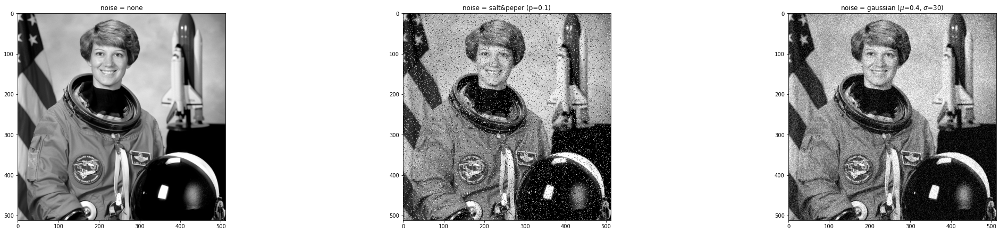

spectrum for noise = none


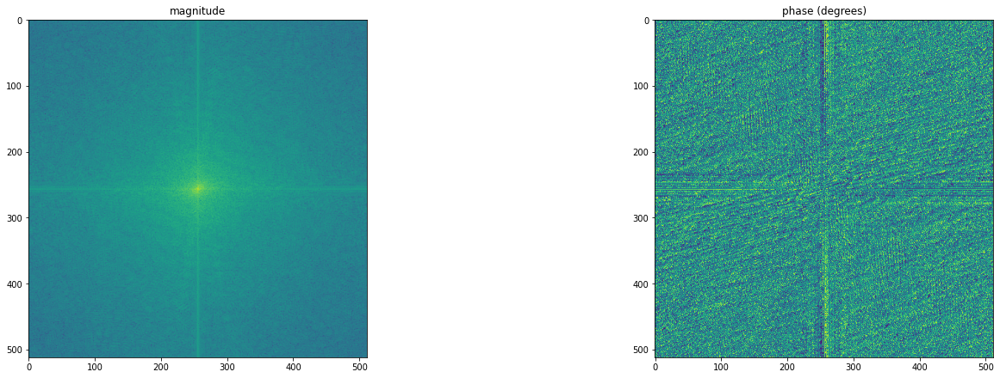

spectrum for noise = salt&peper (p=0.1)


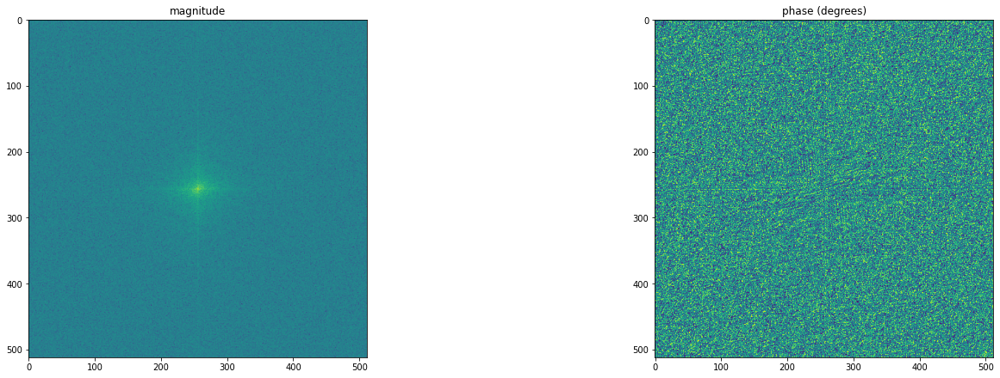

spectrum for noise = gaussian ($\mu$=0.4, $\sigma$=30)


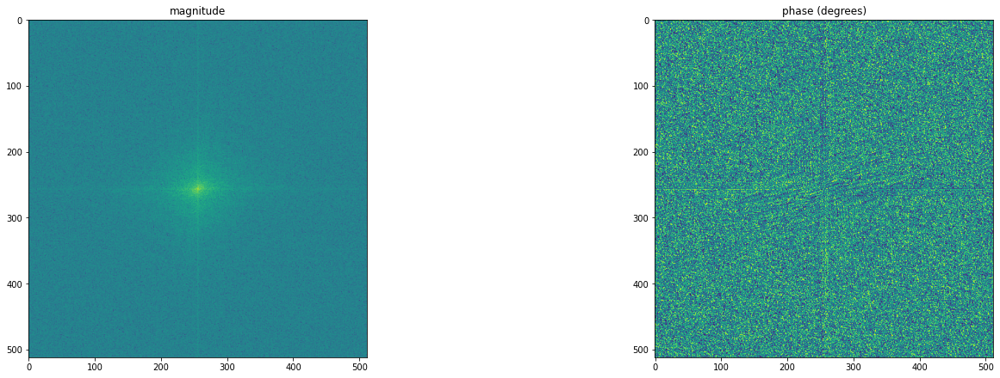

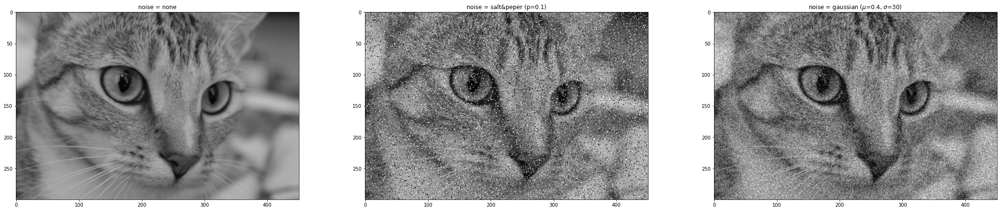

spectrum for noise = none


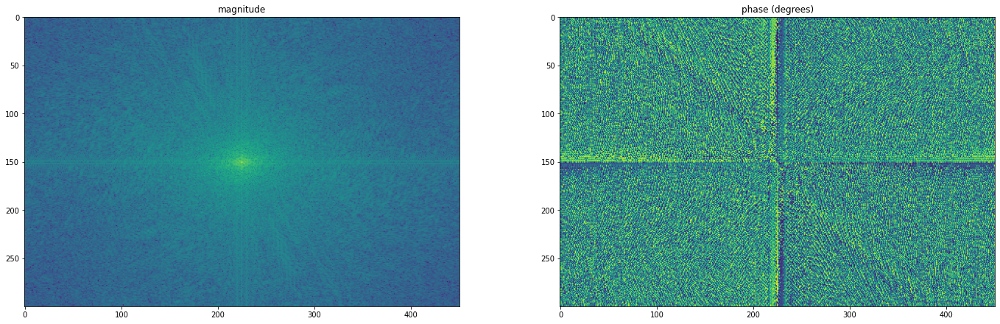

spectrum for noise = salt&peper (p=0.1)


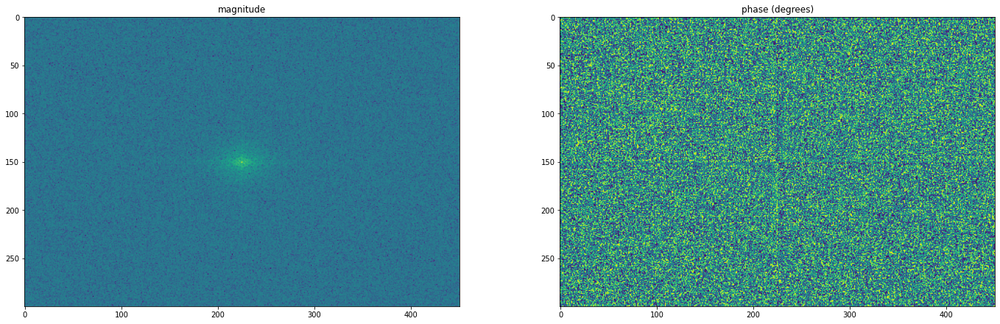

spectrum for noise = gaussian ($\mu$=0.4, $\sigma$=30)


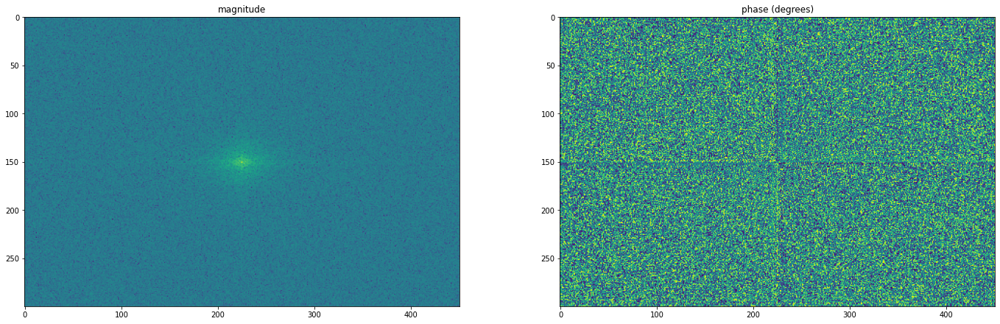

In [7]:
def plot_spectrum(img) -> None:
    fig, axs = plt.subplots(1, 2, figsize=(20, 6), constrained_layout=True)

    xFFT = np.fft.fftshift(np.fft.fft2(img))
    for ax, name in zip(axs.flat, ["magnitude", "phase (degrees)"]):
        ax.set_title(f'{name}')
        # Magnitude spectrum
        if name.startswith("magnitude"):
            #log is for flattening
            ax.imshow(np.log10(np.abs(xFFT)))
        # Phase spectrum
        elif name.startswith("phase"):
            ax.imshow(np.rad2deg(np.angle(xFFT)), vmin = -180, vmax = 180 )
    plt.show()

def make_experiment(img, **kwrgs):
    fig, axs = plt.subplots(1, 3, figsize=(30, 6), constrained_layout=True)
    s_p = kwrgs.get("s_p", 0.1)
    mu, sigma = kwrgs.get("mu", 0.4), kwrgs.get("sigma", 30)
    cases = ["none", f"salt&peper (p={s_p})", f"gaussian ($\mu$={mu}, $\sigma$={sigma})"]
    for ax, name in zip(axs.flat, cases):
        ax.set_title(f'noise = {name}')
        if name.startswith("salt&peper"):
            ax.imshow(saltpepper_noise(img, s_p), cmap='gray', vmin=0, vmax=255)
        elif name.startswith("gaussian"):
            ax.imshow(gaussian_noise(img, mu, sigma), cmap='gray', vmin=0, vmax=255)
        else: 
            ax.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.show()

    cases = ["none", f"salt&peper (p={s_p})", f"gaussian ($\mu$={mu}, $\sigma$={sigma})"]
    for name in cases:
        print(f"spectrum for noise = {name}")
        if name.startswith("salt&peper"):
            plot_spectrum(saltpepper_noise(img, s_p))
        elif name.startswith("gaussian"):
            plot_spectrum(gaussian_noise(img, mu, sigma))
        else: 
            plot_spectrum(img)



make_experiment(img = cv2.cvtColor(
                src=data.astronaut(),
                code=cv2.COLOR_RGB2GRAY))

make_experiment(img = cv2.cvtColor(
                src=data.cat(),
                code=cv2.COLOR_RGB2GRAY))




## Вопрос 4

В чем разница шумов на полученных спектрах? Посмотрите также разницу на других фотографиях - они доступны в `skimage.data`

Все шумы полностю размешивают фазу фигнала, больше это делает шум типа "соль и перец", оба шума глушат спектальную интесивность, гауссов делает это более равномерно.

# Базовые фильтры

![](http://www.djvu-soft.narod.ru/bookscanlib/cf1.jpg)

![](http://www.djvu-soft.narod.ru/bookscanlib/cf2.jpg)

Рассмотрим линейные фильтры, основанные, конечно же, на конволюции.

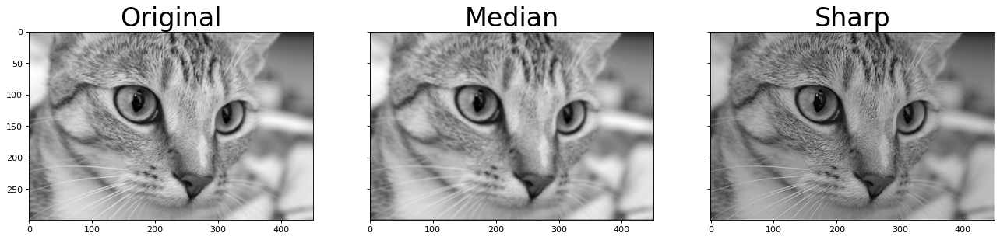

Original


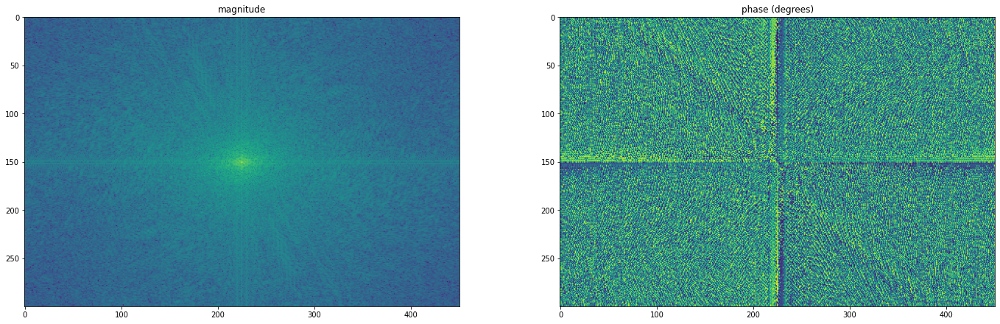

Median


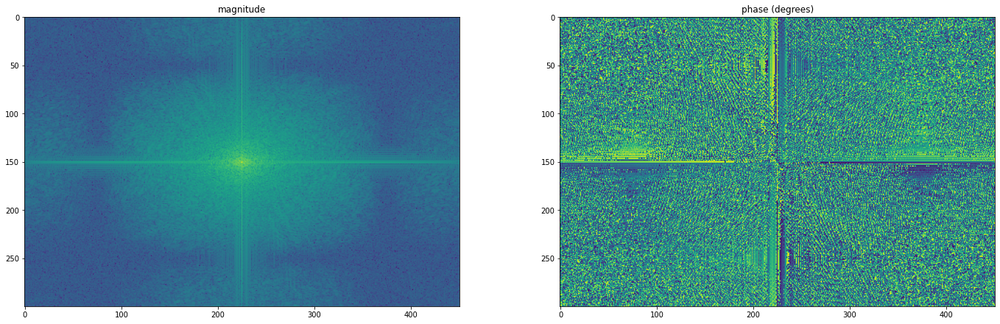

Sharp


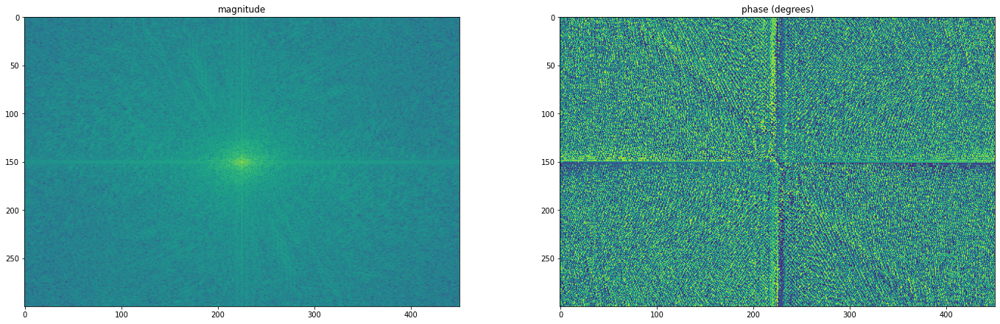

In [ ]:
nothing = np.array([
    [1., ],
])

mean = np.array([
    [1, 1, 1, ],
    [1, 1, 1, ],
    [1, 1, 1, ],
]) / 9

sharp = np.array([
    [0, -1, 0, ],
    [-1, 9, -1, ],
    [0, -1, 0, ],
]) / 5

filters = [nothing, mean, sharp, ]
lst_title = ['Original', 'Median', 'Sharp', ]

fig, axes = plt.subplots(
    ncols=len(lst_title),
    sharex=True,
    sharey=True,
    figsize=(20, 10),
    dpi=80,
)
imgs = []
for i in range(len(filters)):

    filtered_img = cv2.filter2D(
        src=img,
        kernel=filters[i],
        ddepth=-1, #the same depth as input
        borderType=cv2.BORDER_CONSTANT,
        anchor=(-1, -1), #center of the kernel
        delta=0, #additional data added to
    )
    axes[i].imshow(filtered_img, cmap='gray')
    axes[i].set_title(lst_title[i], fontsize=30)
    imgs.append(filtered_img)
plt.show()
for img, title in zip(imgs, lst_title):
    print(title)
    plot_spectrum(img)

Особенность свертки - ее локальность. Чем больше ядро светки - тем в большей окрестности она охватывает пиксели.

## Вопрос 5

Проанализируйте спектр и фазы зашумленных сигналов после применения фильтров. Что изменилось? Спектпы увеличивают интенсивность: медианный фильтр делает это "окошками", оставляя квадратные следы, а гауссиан лапласиана делает это равномерно. Фаза становится более ярко выражена, опять же последний фильтр делает это глаже, медианный же оставляет это с артефактами.

## Вопрос 6

Реализуйте свою свертку и сравните с реализацией `cv2.filter2D`. 

In [ ]:
#your code here
import numpy as np
import cv2
def convolution2d(image, kernel, stride, padding):
    image = np.pad(image, [(padding, padding), (padding, padding)], mode='reflect')

    kernel_height, kernel_width = kernel.shape
    padded_height, padded_width = image.shape

    output_height = (padded_height - kernel_height) // stride + 1
    output_width = (padded_width - kernel_width) // stride + 1

    new_image = np.zeros((output_height, output_width)).astype(np.float32)

    for y in range(0, output_height):
        for x in range(0, output_width):
            new_image[y][x] = np.sum(image[y * stride : y * stride + kernel_height, x * stride : x * stride + kernel_width] * kernel).astype(np.float32)
    return new_image

image = np.random.randn(64, 64)
kernel = np.random.randn(3, 3)

cc = convolution2d(image, kernel, stride=1, padding=1)
print(cc[10][:5])
cc_cv = cv2.filter2D(src = image, ddepth=-1, kernel = kernel)
print(cc_cv[10][:5])

[ 2.1818278 -1.0987595 -1.790389  -4.6266913  4.533333 ]
[ 2.1818277  -1.09875952 -1.79038898 -4.62669128  4.53333283]


Рассмотрим нелинейные фильтры. Многие из них нелокальны и адаптивны.

1. Медианный фильтр
```python
filtered_img = cv2.medianBlur(
      src=img,
      ksize=(5, 5), #kernel size
)
```
2. Гистограмное выравнивание
```python
filtered_img = cv2.equalizeHist(
      src=img,
)
```
3. Contrast Limited Adaptive Histogram Equalization (CLAHE). Описание [англ](https://en.wikipedia.org/wiki/Adaptive_histogram_equalization#Contrast_Limited_AHE)
```python
clahe = cv2.createCLAHE(
      clipLimit=40.0, # Threshold for contrast limiting
      tileGridSize=(8, 8),  # Grid size
)
filtered_img = clahe.apply(img)
```
4. Билатеральный фильтр. Описание [англ](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html), [рус](https://habr.com/ru/post/273159/)
```python
filtered_img = cv2.bilateralFilter(
      src=img,
      d=9, #Diameter of each pixel neighborhood
      sigmaColor=75,  #Filter sigma in the color space
      sigmaSpace=75, #Filter sigma in the coordinate space
      borderType=cv2.BORDER_CONSTANT,
)
```

Разберем подробнее Гистограмное Выравнивание.

Рассмотрим изображение, значения пикселей которого ограничены только определенным диапазоном значений. Например, на более ярком изображении все пиксели будут ограничены высокими значениями. Но хорошее изображение будет содержать пиксели из всех областей изображения. Поэтому вам нужно растянуть эту гистограмму до обоих концов, и это то, что делает выравнивание гистограммы (простыми словами). Обычно это улучшает контрастность изображения.

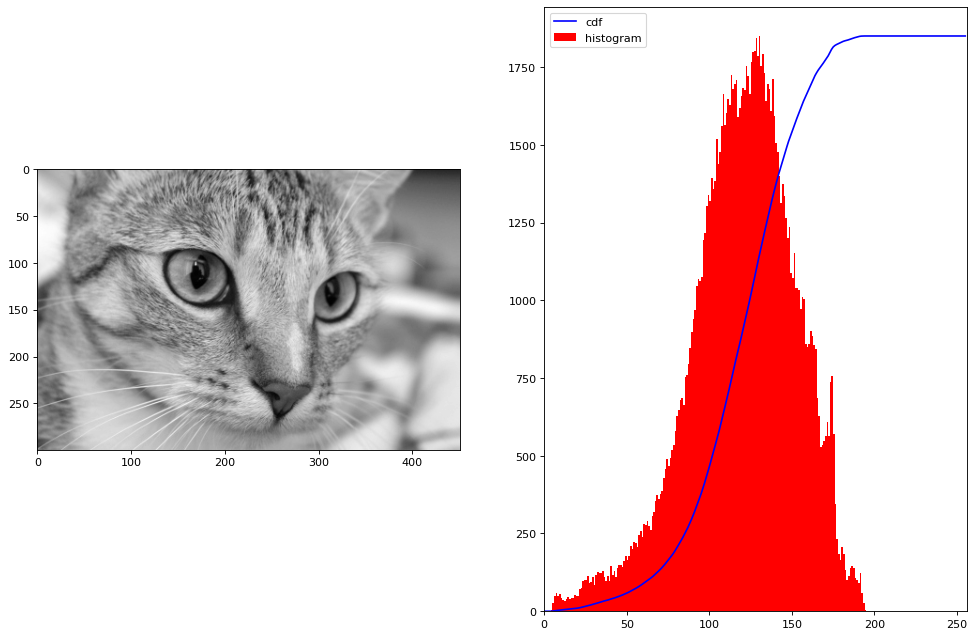

In [11]:
img = cv2.cvtColor(
    src=data.cat(),
    code=cv2.COLOR_RGB2GRAY,
)

def plot_hist(
    img: np.array,
) -> None:

    fig, axes = plt.subplots(
        ncols=2,
        figsize=(15, 10),
        dpi=80,
    )

    axes[0].imshow(
        img,
        cmap='gray',
    )

    hist, bins = np.histogram(
        a=img.flatten(),
        bins=256,
        range=[0,256],
    )
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    axes[1].plot(
        cdf_normalized,
        color='b',
    )
    axes[1].hist(
        x=img.flatten(),
        bins=256,
        range=[0,256],
        color='r',
    )
    axes[1].set_xlim([0,256])
    axes[1].legend(
        ('cdf','histogram'),
        loc='upper left',
    )

def unhist(
    img: np.array,
) -> None:

    hist, bins = np.histogram(
        a=img.flatten(),
        bins=256,
        range=[0,256],
    )
    cdf = hist.cumsum()

    cdf_m = np.ma.masked_equal(
        x=cdf,
        value=0,
    )
    cdf_m = (cdf_m - cdf_m.min())/(cdf_m.max() - cdf_m.min()) * 255

    cdf = np.ma.filled(
        a=cdf_m,
        fill_value=0,
    )

    cdf = cdf.astype(np.uint8)

    unhist_img = cdf[img]

    return unhist_img

plot_hist(img)

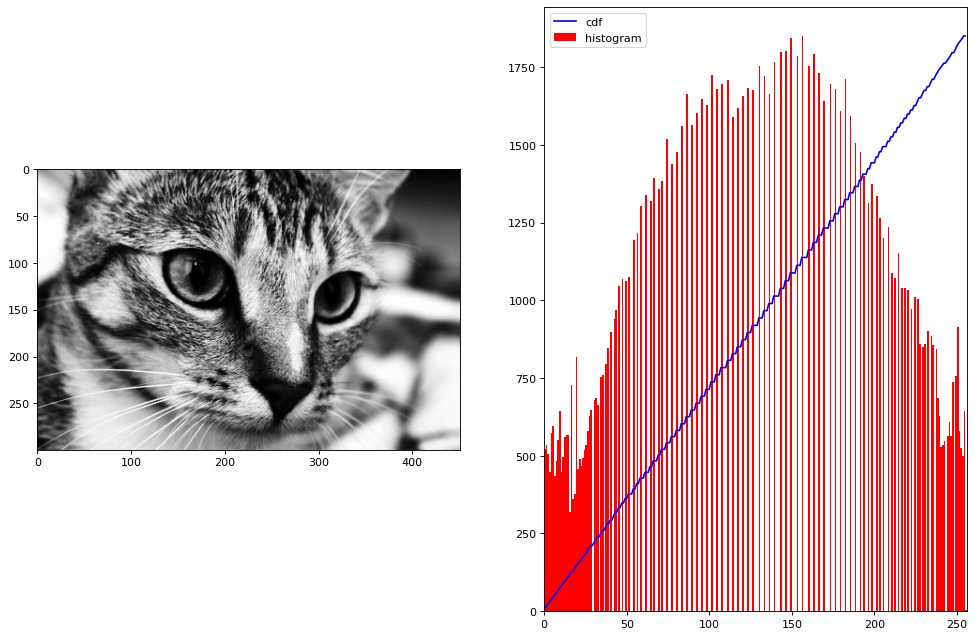

In [12]:
plot_hist(unhist(img))

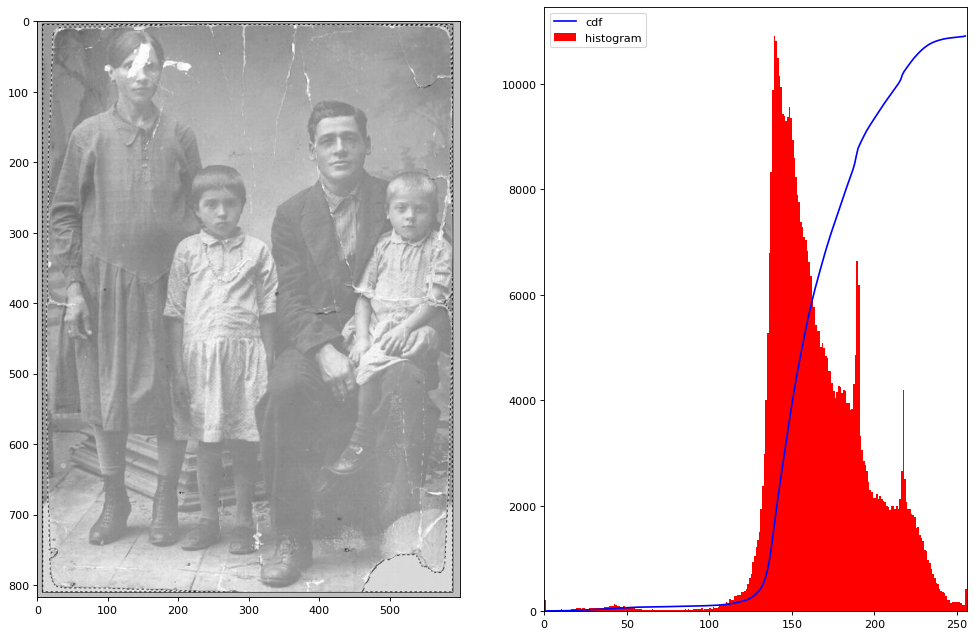

In [13]:
IMG_PATH = "data/image.jpg"

if not Path(IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_03/data .

img = cv2.cvtColor(
    src=cv2.imread(IMG_PATH),
    code=cv2.COLOR_RGB2GRAY,
)

plot_hist(img)

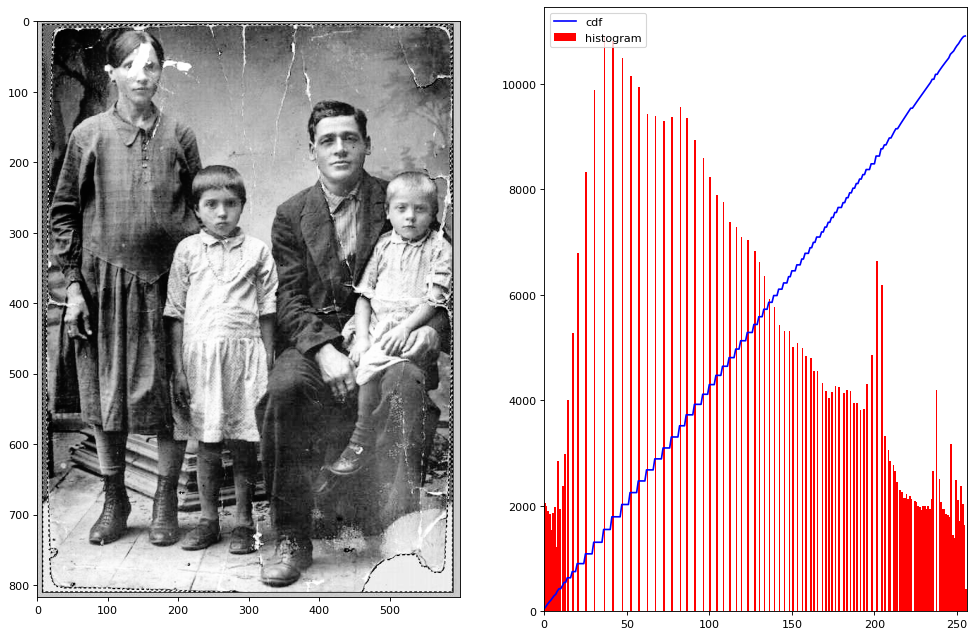

In [14]:
plot_hist(unhist(img))

## Вопрос 7

Примените адаптивное гистограммное выравнивание CLAHE, сравните результат с тем, что получалось при обычном гистограммном выравнивании. 

Spoiler -- оно лучше спектр широкий и плавный, покрытие cdf очень даже равномерное.

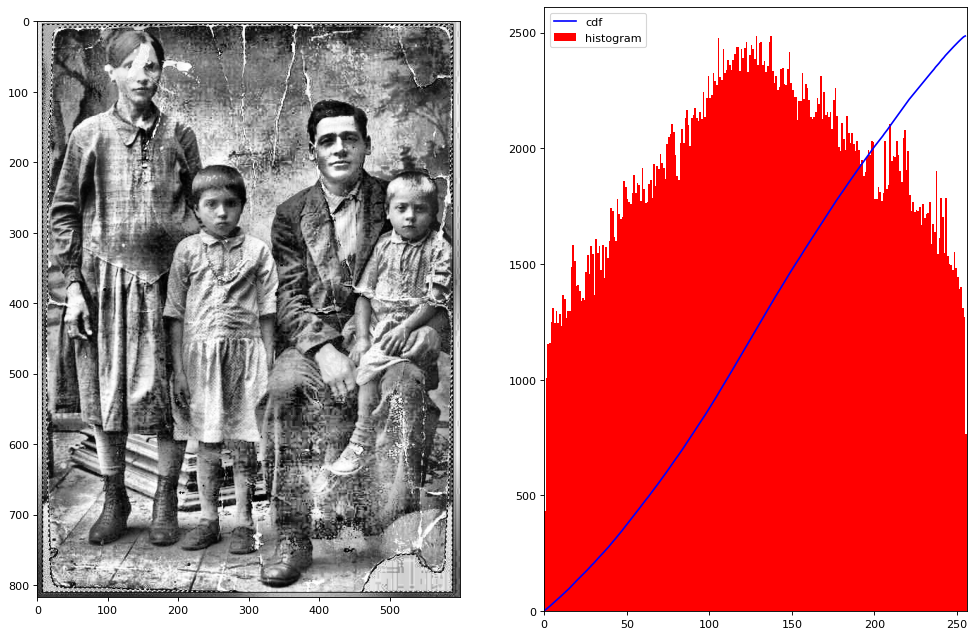

In [15]:
#your code here
clahe = cv2.createCLAHE(
   clipLimit=50.0, # Threshold for contrast limiting
   tileGridSize=(10, 10),  # Grid size
)
filtered_img = clahe.apply(img)
plot_hist(filtered_img)

### Оценка качества улучшения фильтрации

$X[i, j]$ - входной сигнал (шумный), $\hat{X}[i, j]$ - входной сигнал (сглаженный)

1. $\text{MSE}(X, \hat{X}) = \frac{1}{NM}\sum\limits_{i, j}\left(X[i, j] - \hat{X}[i, j]\right)^{2}$

2. $\text{PSNR}(X, \hat{X}) = 20\log\frac{\max(\hat{X})}{\sqrt{MSE(X, \hat{X})}}$

3. $\text{SSIM}(X, \hat{X}) = \left[ l(X, \hat{X})^\alpha \cdot c(X, \hat{X})^\beta \cdot s(X, \hat{X})^\gamma \right]$

Подробнее [SSIM](https://en.wikipedia.org/wiki/Structural_similarity)

## Вопрос 8

Посчитайте PSNR между оригинальным изображением и зашумленным соль/перец, размытым гаусовским шумом, гистограмно-выравненым, с использованием CLAHE. Есть ли существенная разница? Почему?

https://cvnote.ddlee.cc/2019/09/12/psnr-ssim-python

In [30]:
#your code here
import math
import numpy as np

def calculate_psnr(img1, img2):
    # img1 and img2 have range [0, 255]
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))

import math
import numpy as np
import cv2

def ssim(img1, img2):
    C1 = (0.01 * 255)**2
    C2 = (0.03 * 255)**2

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    kernel = cv2.getGaussianKernel(11, 1.5)
    window = np.outer(kernel, kernel.transpose())

    mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]  # valid
    mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1 * mu2
    sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
    sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
    sigma12 = cv2.filter2D(img1 * img2, -1, window)[5:-5, 5:-5] - mu1_mu2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) *
                                                            (sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean()


def calculate_ssim(img1, img2):
    '''calculate SSIM
    the same outputs as MATLAB's
    img1, img2: [0, 255]
    '''
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1, img2))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

def calculate_metrics(img1, img2):
    return f"| psnr = {round(calculate_psnr(img1, img2), 3)}, \t ssim = {round(calculate_ssim(img1, img2), 3)}"


In [31]:
print(
    f" hist. aligned {calculate_metrics(img, unhist(img))}\n",
    f"CLAHE {calculate_metrics(img, clahe.apply(img))}\n", 
    f"salt & pepper noised {calculate_metrics(img, saltpepper_noise(img, 0.2))}\n",
    f"gaussian noised {calculate_metrics(img, gaussian_noise(img, 0.4, 30))}\n",
    
)

 hist. aligned | psnr = 12.65, 	 ssim = 0.63
 CLAHE | psnr = 12.455, 	 ssim = 0.448
 salt & pepper noised | psnr = 12.429, 	 ssim = 0.08
 gaussian noised | psnr = 18.737, 	 ssim = 0.201



Интерпретация: данное исследование показывает разницу между двумя метриками, `psnr` и `ssim`: первая метрика примерно одинаковая (на мой взгляд) между зашумлёнными и восстановленными изображениями, что показывает её неидеальность;
`ssim` же делится на две группы, она особо низкая у шумных изображения (0.01-0.2), восстановленные изображения имеют метрику (0.4-0.8), причём изображение, восстановленное с помощью гистограммного выравнивания имеет более низкие значения, чем с помощью более точного алгоритма `clahe`.